# **Environmental SetUp**

In this section, we import all the required libraries and also set up some constants.

In [57]:
# Data 
import numpy as np
import pandas as pd

# Data Viz
import plotly.express as px
import matplotlib.pyplot as plt

# Data Processing
from sklearn.model_selection import train_test_split

# Models
from sklearn.linear_model import LinearRegression

# Metrics
from sklearn.metrics import mean_absolute_error as MAE

In [8]:
# Reproducibility
SEED = 852

# **Why Interpretable Models?**

Interpretable machine learning models are crucial for several reasons, especially in fields where transparency, accountability, and understanding of decisions are essential. Let's delve into an example to illustrate this point:

Imagine a scenario in the medical field where a hospital is using a machine learning model to predict whether a patient is at risk of developing a particular disease based on their medical history and demographics. Now, let's consider two scenarios:

1. Black Box Model: The hospital deploys a complex, black-box model such as a deep neural network. While this model might provide high accuracy in predictions, the inner workings of the model are highly intricate and difficult to understand. If the model predicts a patient is at risk, it offers no insight into why that prediction was made. As a result, doctors and patients are left in the dark, unable to understand or trust the model's decisions.

2. Interpretable Model: Alternatively, the hospital chooses to use a simpler, interpretable model such as a decision tree or logistic regression. These models may sacrifice some predictive accuracy compared to complex models, but they offer transparency and explainability. For instance, a decision tree model might show that a patient's risk of the disease is influenced by factors such as age, family history, and cholesterol levels. This explanation helps doctors and patients understand why a certain prediction was made, enabling them to trust and act upon the model's recommendations confidently.

In this example, the need for interpretable machine learning models becomes evident. Doctors need to understand the reasoning behind a model's predictions to make informed decisions about patient care. Moreover, interpretable models facilitate accountability and enable stakeholders to identify biases or errors in the model's decision-making process, ultimately leading to better outcomes for patients. Therefore, interpretable models play a critical role in domains where transparency and trust are paramount, such as healthcare, finance, and criminal justice.

---

Let's consider the example of a credit scoring system used by banks to assess the creditworthiness of loan applicants. In this scenario, interpretable machine learning models are essential for several reasons:

1. **Transparency**: Interpretable models provide transparency into the factors influencing the credit score assigned to an individual. For instance, a logistic regression model might reveal that factors such as credit history length, debt-to-income ratio, and number of recent credit inquiries significantly impact the credit score. This transparency helps applicants understand why their credit score is what it is and what actions they can take to improve it.

2. **Fairness and Bias Detection**: Interpretable models allow stakeholders to detect and mitigate biases in the credit scoring process. By examining the model's decision-making process, banks can ensure that the model does not unfairly discriminate against certain demographic groups. For example, if a decision tree model shows that race or gender is a significant predictor of creditworthiness, it raises red flags about potential bias in the data or model construction process.

3. **Consumer Trust**: Trust is crucial in financial transactions, particularly when it comes to borrowing and lending money. Interpretable models help build trust between banks and loan applicants by providing clear explanations for credit decisions. When applicants understand why their loan application was approved or denied, they are more likely to trust the bank's judgment and feel confident in the fairness of the process.

4. **Regulatory Compliance**: Many jurisdictions have regulations in place to ensure fair lending practices and prevent discrimination in credit scoring. Interpretable models facilitate compliance with these regulations by allowing banks to demonstrate that their credit scoring processes are transparent, unbiased, and based on relevant factors related to creditworthiness.

In summary, interpretable machine learning models play a crucial role in credit scoring systems by providing transparency, detecting biases, building consumer trust, and ensuring regulatory compliance. By using interpretable models, banks can make more informed and fair decisions about loan approvals while maintaining trust and confidence among applicants.

## **My PoV (Right To Information)**

There is a potential conflict between the use of black box AI systems and the principles of transparency and the right to information. Here's how you could articulate this viewpoint:

"In light of the increasing reliance on black box AI systems for decision-making in various domains, there arises a significant challenge regarding transparency and the right to information. These systems often make complex decisions without providing clear explanations for why those decisions were made. This opacity undermines the principles of transparency and accountability, which are fundamental to democratic societies.

Under the Right to Information Act (or similar legislation in various jurisdictions), individuals have the right to access information held by public authorities. However, the use of black box AI systems in decision-making processes creates a barrier to accessing meaningful information about the rationale behind those decisions. As a result, individuals may be deprived of their right to understand the basis for decisions that affect their lives, whether it's being denied a loan, receiving medical treatment, or facing criminal charges.

Moreover, the lack of transparency in black box AI systems poses challenges for legal accountability and due process. In legal proceedings, individuals have the right to challenge decisions that affect their rights or interests. However, without transparent explanations for AI-driven decisions, it becomes difficult for individuals to contest the fairness or legality of those decisions.

Therefore, there is a pressing need to reconcile the use of AI systems with the principles of transparency and the right to information. This may involve implementing regulations or guidelines that require AI systems to provide explanations for their decisions in a clear and understandable manner. Additionally, there should be mechanisms in place to ensure accountability and oversight of AI systems to safeguard against potential biases or errors. By addressing these concerns, we can uphold the principles of transparency and accountability while harnessing the benefits of AI technology in decision-making processes." 

This viewpoint highlights the importance of addressing the transparency and accountability challenges posed by black box AI systems to ensure that individuals' rights to information and legal recourse are protected in an increasingly automated world.

# **What is Machine Learning Interpretation?**

Interpreting an algorithm involves explaining why a particular decision is made or understanding its inner workings. Algorithms, typically structured mathematical codes, transform inputs into outputs. Interpretability comes into play by elucidating the process between input and output. For instance, in a simple linear regression, it's essential to grasp how the model uses input variables to predict an outcome. This understanding enables transparency and trust in algorithmic decision-making processes. Let's have a look at Simple Linear regression:

> $Ŷ =$ ${β_0}$ + ${β_1 . x_1}$

This is the equation for a simple linear regression model with just a single input feature. The final output of this model is based on two parameters the ${β_0}$ & ${β_1}$. The ${β_0}$ is also called "Intercept" and ${β_0}$ as "Coefficient(or Slope)".

In [2]:
# Load the file
hw = pd.read_csv("Datasets/HeightsWeights.csv")  # hw : heights weights

# Quick Look
hw.head(5)

,Height(Inches),Weight(Pounds)
0,65.78331,112.9925
1,71.51521,136.4873
2,69.39874,153.0269
3,68.21660,142.3354
4,67.78781,144.2971


In [5]:
# Quick Check
hw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25000 entries, 0 to 24999
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Height(Inches)  25000 non-null  float64
 1   Weight(Pounds)  25000 non-null  float64
dtypes: float64(2)
memory usage: 390.8 KB


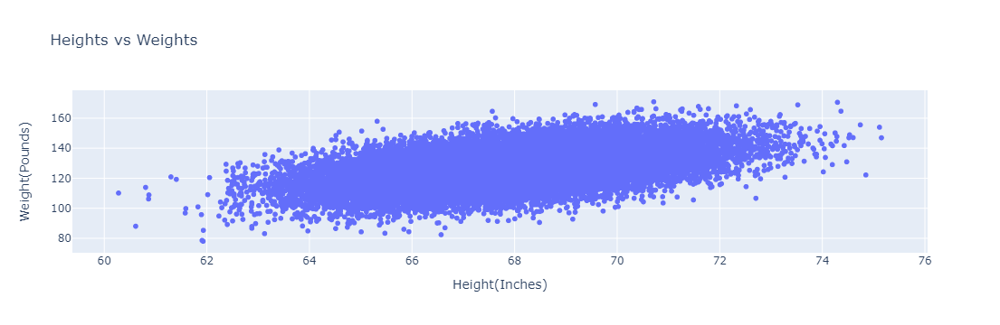

In [44]:
scatter = px.scatter(hw,x="Height(Inches)", y="Weight(Pounds)" , title="Heights vs Weights")
scatter.show()


Just look by looking at these catapult between the heights and the weights. We can clearly see that as the height increases, the white weight tends to increase. Although this increase is extremely minimum. so I don't expect the data to be inherently linear. Thus, the linear regression will obviously not be able to perform extremely good on this data because the data is inherently not linear, as one of the mean assumptions of linear regression is that the data has to be linearly coordinated.

---

To explore model interpretability, let's consider an example where we aim to predict weights based on heights. We'll examine whether a linear regression model can effectively accomplish this task.

In [62]:
# Splitting Data
X, y = hw["Height(Inches)"].to_numpy().reshape(-1, 1), hw["Weight(Pounds)"].to_numpy().reshape(-1, 1)

In [64]:
# Initialize and fit linear regression model
lr = LinearRegression()                                                # Default Params
lr.fit(X, y)                                               # Model training

LinearRegression()

The main idea or the overall concept is to attain the following equation:

> $Weights =$ ${β_0}$ + ${β_1 . Heights }$

Where the parameters are estimated with the help of linear aggression model.

In [65]:
intercept = lr.intercept_[0]
coef = lr.coef_[0][0]

In [66]:
print(f"Weights = {intercept} + {coef} * Heights")

Weights = -82.57574306454093 + 3.0834764454029666 * Heights


The coefficient parameter represents the importance of the input feature, which in this case is height. A coefficient of zero implies no importance, negative values indicate negative importance, and higher positive values signify greater importance. Here, with a coefficient around 3.1, height is given considerable attention in predicting weight.

In [67]:
r_sq = lr.score(X, y)
print(f"Training LR R^2: {r_sq}")

Training LR R^2: 0.2528666917428807


With an ${R^2}$ value of 0.25, the model explains only about 25% of the data, indicating its limited explanatory power. This outcome was anticipated, given the non-linear nature of the dataset.

In [70]:
# Make Predictions
y_pred = lr.predict(X)

# MAE
mae = MAE(y, y_pred)
print(f"Mean Absolute Error: {mae}")

Mean Absolute Error: 8.037502348939364


The mean absolute error can be interpreted as, the model predictions can be wrong up to the magnitude like $ Pred ± MAE$.

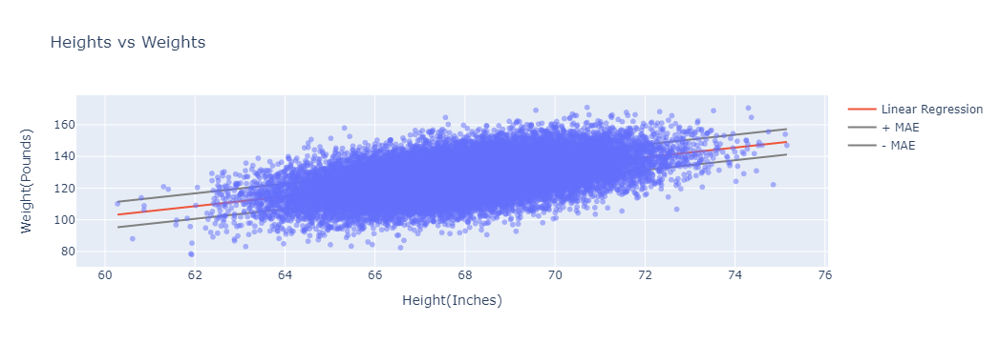

In [84]:
# Obtain the Best Fit Line
best_fit_line = intercept + coef * hw["Height(Inches)"]

# Create scatter plot
scatter = px.scatter(hw, x="Height(Inches)", y="Weight(Pounds)", title="Heights vs Weights", opacity=0.5)

# Add linear regression line
scatter.add_scatter(x=hw["Height(Inches)"], y=best_fit_line, mode='lines', name='Linear Regression')
scatter.add_scatter(x=hw["Height(Inches)"], y=best_fit_line + mae, mode='lines', line=dict(color="gray"), name="+ MAE")
scatter.add_scatter(x=hw["Height(Inches)"], y=best_fit_line - mae, mode='lines', line=dict(color="gray"), name="- MAE")
scatter.show()

Due to the large number of samples it's quite quite tough to interpret. So let's reduce the total of samples.

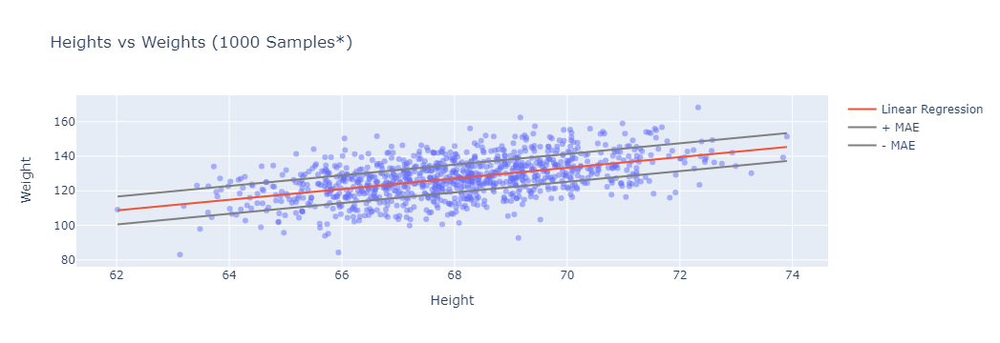

In [88]:
# Obtain the Best Fit Line
best_fit_line = intercept + coef * hw["Height(Inches)"][:1000]

# Create scatter plot
scatter = px.scatter(x=hw["Height(Inches)"][:1000], y=hw["Weight(Pounds)"][:1000], title="Heights vs Weights (1000 Samples*)", opacity=0.5)
scatter.update_layout(xaxis_title="Height", yaxis_title="Weight")

# Add linear regression line
scatter.add_scatter(x=hw["Height(Inches)"][:1000], y=best_fit_line, mode='lines', name='Linear Regression')
scatter.add_scatter(x=hw["Height(Inches)"][:1000], y=best_fit_line + mae, mode='lines', line=dict(color="gray"), name="+ MAE")
scatter.add_scatter(x=hw["Height(Inches)"][:1000], y=best_fit_line - mae, mode='lines', line=dict(color="gray"), name="- MAE")
scatter.show()

Model Insights: 
1. The linear regression model effectively captures the linear trend of the data and aligns well with its midpoint.
2. However, the mean absolute error lines provide only an average tendency of errors and do not accurately represent the absolute errors of each individual point.

Visualizing the error of a model is crucial for understanding how well it fits the data. In this context, the error refers to the discrepancy between the actual values and the predicted values by the model. By examining the distribution of these errors, we can identify patterns or anomalies that may indicate issues with the model.

In the provided graph, if the residuals (errors) exhibit consistent spread across different ranges of heights, it indicates `homoscedasticity`. This means that the variability of the errors is similar across the entire range of predictor variables (heights in this case). `Homoscedasticity` is desirable in linear regression because it suggests that the model's performance is consistent across different levels of the predictor variable.

Identifying `homoscedasticity` is important because it confirms that the model meets one of the key assumptions of linear regression. However, it's just one of several assumptions that need to be assessed when using linear regression. Other important assumptions include `linearity` (relationship between variables), `normality` (residuals are normally distributed), `independence` (residuals are not correlated), and `lack of multicollinearity` (if multiple predictor variables are used). Checking these assumptions helps ensure the reliability and validity of the regression model.

---

One method to assess linear correlation in data without using a linear regression model is by calculating the Pearson correlation coefficient.

In [93]:
hw.corr(method="pearson")

,Height(Inches),Weight(Pounds)
Height(Inches),1.000000,0.502859
Weight(Pounds),0.502859,1.000000


Understanding the Pearson correlation coefficient is crucial. A coefficient of -1 indicates a strong negative relationship, +1 signifies a strong positive relationship, and 0 suggests no correlation. Values between -1 and +1 denote varying degrees of correlation strength, with 0.50, for example, indicating a moderate positive correlation. In this case, the coefficient between heights and weights is 0.50, indicating a positive correlation, though not exceptionally strong.

---
Analyzing the scatter plot we created earlier, we can observe that the slope of the data points doesn't exhibit a significant increase as height increases. While there is a positive linear relationship between height and weight, it's not particularly strong.

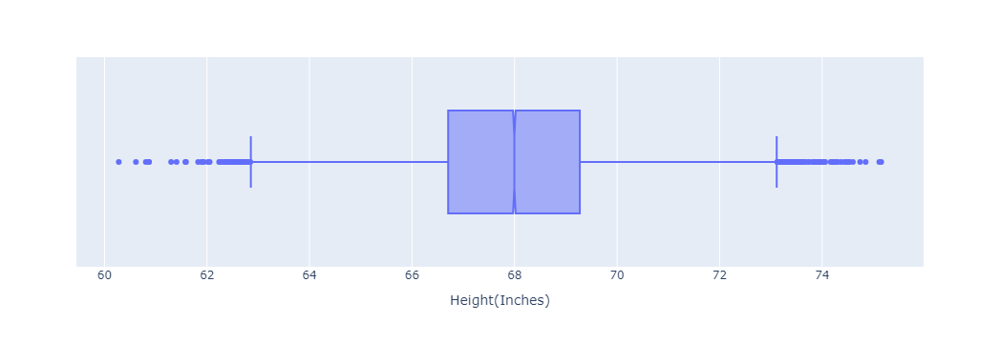

In [101]:
box_plot = px.box(hw, x="Height(Inches)", notched=True)
box_plot.show()

The model's accuracy might seem impressive, but it's not practical for real-world applications due to its limitations. Looking at the box plot, we see that the range of heights in our dataset is quite narrow, mainly falling between 63 to 73. This means the model can only reliably predict weights for individuals within this height range, excluding those outside it, like teenagers or individuals over 80.

Moreover, relying solely on height to predict weight overlooks other influential factors, such as gender. If our data only includes females, the model will only capture the relationship between height and weight for females, potentially leading to biased predictions. This is known as **selection bias**.

Furthermore, our model suffers from **omitted variable bias** by not considering other relevant factors that could affect weight. While adding more features could potentially improve the model's performance, it's not always the case. Some features may not contribute meaningfully to predictions and could even degrade performance, leading to what's known as the **curse of dimensionality**. Therefore, understanding **feature importance** is crucial for building effective models while balancing dimensionality and performance.

## **Whats the Ultimate Goal?**

When focusing on interpretable machine learning models, the aim is not just to enhance performance, but also to improve interpretability. Interpretability involves three key factors: fairness, accountability, and transparency (FAT). Fairness ensures unbiased predictions, while accountability provides reasons behind each prediction, and transparency reveals how predictions are made.

Expanding on FAT, some researchers and companies include ethical artificial intelligence (AI), forming FATE. Ethical AI contributes to broader discussions on algorithmic and data governance, emphasizing responsible and transparent use of AI technologies.

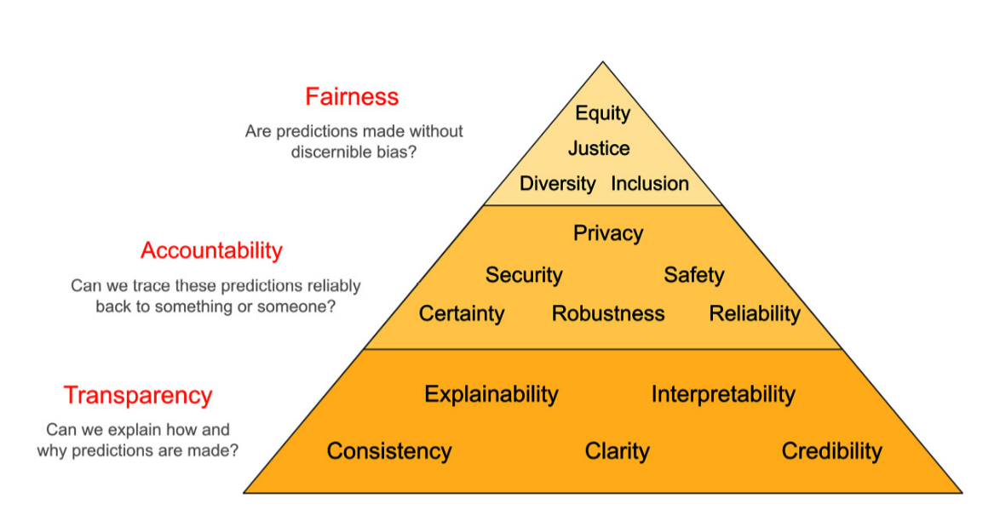

Source: [Interpretable Machine Learning with Python](https://www.amazon.com/Interpretable-Machine-Learning-Python-hands/dp/180020390X)

# **Interpretability vs Explainability**

Even though both the terms are used interchangeably to describe the same thing in machine learning, yet, they are quite different.

## **Interpretability**

Interpretability refers to the degree to which humans can understand the reasoning behind a model's inferences. It involves explaining why a particular input led to a specific output, enabling clear understanding of the model's decision-making process. For interpretability, detailing how a model works is only relevant to the extent that it can explain its predictions and justify that it's the right model for the use case.

Sometimes the models become so opaque that it's almost impossible to describe the internal workings due to its extreme mathematics. That's when the Post-hoc interpretability comes into play. Post-hoc interpretability refers to the process of interpreting a model's decisions after it has made predictions. Unlike models designed with inherent interpretability, which provide transparency into their decision-making process during prediction, post-hoc interpretability techniques aim to explain the model's behavior retrospectively. These techniques often involve analyzing the model's internal mechanisms, such as feature importance, attention weights, or decision rules, to gain insights into how it arrived at its predictions. Post-hoc interpretability methods are particularly valuable for complex models, such as deep neural networks, where understanding the internal workings can be challenging.

Interpretability is not always demanded sometimes. Sometimes it can be excluded, like the following two cases:

- When the incorrect results have no greater consequences.
- Even if there are negative consequences, the problem itself have studied and validated that it can still make decisions without any human involvement.

Although interpretability is required when we look forward to:

- Scientific knowledge
- Reliablity & Safety
- Ethical
- Conclusive & Consistent


## **Explainability**

Explainability and interpretability are closely related concepts, with one major distinction between them. While interpretability focuses on understanding the model's inferences, explainability delves deeper by also considering the model's internal mechanisms and training processes. In other words, interpretability primarily deals with explaining the model's predictions, whereas explainability encompasses a broader scope that includes insights into the model's inner workings, such as its training procedures and decision-making processes.

When discussing explainability, we aim for transparency in three key areas:

1. `Model transparency`: This entails being able to explain how the model was trained and how it operates.
   
2. `Design transparency`: This involves understanding why specific architectural choices or hyperparameters were selected during the model's development.
   
3. `Algorithmic transparency`: This refers to the ability to elucidate the algorithmic processes or optimization techniques employed by the model.

Trustworthy and ethical decision-making serves as the primary motivation for interpretability. However, explainability offers additional benefits, including considerations for causality, transferability, and informativeness. Consequently, there are numerous scenarios where complete or near-complete transparency is highly valued, and for good reason. Some of these contexts include:

- Scientific research
- Clinical trials
- Consumer product safety
- Public policy or law: This area warrants a nuanced discussion, as legal scholars have introduced concepts such as `algorithmic governance`, distinguishing between `fishbowl transparency` and `reasoned transparency`.
- Criminal investigation